In [2]:
import numpy as np
from matplotlib import pyplot as plt
import cv2 as cv
from scipy import signal, ndimage
import skimage.feature as feature
import os
from IPython.core.debugger import set_trace
%matplotlib inline

from pylab import rcParams
rcParams['figure.figsize'] = 15,20

In [3]:
class Image:
    filename = ""
    input_dir = "./images/"
    results_dir = "./results/"
    output_dir = "./output/"
    mode = "custom"
    img = 0
    gray = 0
    gradX = 0
    gradY = 0
    kps = 0
    descs = 0
    detected = 0
    tracked_custom = 0
    tracked_sift = 0
    
    def __init__(self, f):
        self.filename = f
        
    def set_mode(self, mode):
        self.mode = mode
        
    def read_image(self):
        self.img = cv.imread(self.input_dir+self.filename)
        
    def set_gray(self):
        self.gray = cv.cvtColor(self.img, cv.COLOR_BGR2GRAY)
        
    def write_result(self, result):
        result = cv.cvtColor(result, cv.COLOR_BGR2RGB)
        status = cv.imwrite(self.results_dir + "/" + self.mode + "/" + self.filename, result)
        
    def write_output(self, output):
        output = cv.cvtColor(output, cv.COLOR_BGR2RGB)
        status = cv.imwrite(self.output_dir + "/" + self.mode + "/" + self.filename, output)
        
    # Method to create a gaussian kernel filter with dimension (size x size) and standard deviation of 'sigma'
    def gaussian_kernel(self, size, sigma):
        weights = []
        sum = 0
        x = np.linspace(-1, 1, size)
        y = np.linspace(1, -1, size)
        xv, yv = np.meshgrid(x, y, indexing='ij')
        for i in range(size):
            for j in range(size):
                x = int(xv[i,j])
                y = int(yv[i,j])
                g = (1/2*np.pi*sigma**2) * np.exp(-(x**2+y**2)/(2*sigma**2))
                sum = sum + g
                weights.append(g)
        weights = weights/sum
        total = 0

        kernel = np.reshape(weights,(size,size))
        return kernel
    
    # Apply sobel filters
    def set_gradient_image(self):
        gKernel = self.gaussian_kernel(3, 0.5)

        # Blur the image using the Gaussian Kernel
        img_blur = signal.convolve2d(self.gray, gKernel, mode='same', boundary='fill')

        # Generate x,y gradients by convolving with Sobel Filters
        Sx = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
        Sy = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

        self.gradX = signal.convolve2d(self.gray, Sx, mode='same', boundary='fill')
        self.gradY = signal.convolve2d(self.gray, Sy, mode='same', boundary='fill')

        return None
    
    # Detect Harris Corners
    def harris_response(self, alpha=0.06):

        Ixx = self.gradX * self.gradX
        Iyy = self.gradY * self.gradY
        Ixy = self.gradX * self.gradY

        window = self.gaussian_kernel(5, 1)
        Ixx = signal.convolve2d(Ixx, window, mode='same', boundary='fill')
        Iyy = signal.convolve2d(Ixx, window, mode='same', boundary='fill')
        Ixy = signal.convolve2d(Ixx, window, mode='same', boundary='fill')

        # determinant
        detA = Ixx * Iyy - Ixy ** 2
        # trace
        traceA = Ixx + Iyy

        return detA - (alpha * (traceA ** 2))
    
    # Perform Non Max Suppression
    def response_non_maxsup(self, hresponse):
        return feature.peak.peak_local_max(hresponse, min_distance = 7, threshold_rel = 0.01)
    
    # Detect keypoints using Harris Corner Detector
    def set_keypoints(self):
        self.set_gradient_image()
        hresponse = self.harris_response()
        self.kps = self.response_non_maxsup(hresponse)
        self.detected = len(self.kps)
        return None
    
    # Build intensity based descriptors
    def build_intensity_descs(self, N=32):
        l = int(N/2)
        img_padded = cv.copyMakeBorder(self.gray, top=l, bottom=l, left=l, right=l, borderType=cv.BORDER_REPLICATE)
        descs_list = []
        for (u,v) in self.kps:
            u = u + l
            v = v + l
            u_top = u - l
            u_bottom = u + l
            v_left = v - l
            v_right = v + l
            patch = img_padded[u_top:u_bottom, v_left: v_right]
            patch_n = (patch - np.mean(patch)) / (np.std(patch)+10**(-7))
            descs_list.append(patch_n)
        self.descs = descs_list
        return None
    
    # Setup the class instance to read the file and generate keypoints and descriptors
    def setup(self):
        self.read_image()
        self.set_gray()
        self.set_keypoints()
        self.build_intensity_descs()
        self.keypoints_vis()
    
    def keypoints_vis(self, show='No'):
        image_color = cv.merge([self.gray, self.gray, self.gray]).astype(np.uint8)

        for kp in self.kps:
            if isinstance(kp, cv.KeyPoint):
                x = int(kp.pt[0])
                y = int(kp.pt[1])
            else:
                x = kp[1]
                y = kp[0]
                
            cv.drawMarker(image_color, (x, y), (255, 0, 0), markerType = cv.MARKER_CROSS, markerSize=10, thickness=2, line_type=cv.LINE_8)

        if show == 'Yes':
            plt.figure()
            plt.imshow(image_color)
            plt.title(self.filename + " - Detected Keypoints(" + self.mode +")")
            plt.axis('off')
            plt.show()
        
        self.write_result(image_color)

        return None
    
    # Generate SIFT Descriptors
    def set_sift_kps_descs(self):
        # Convert 2D tuple keypoints to opencv's keypoint instances format
        kps = [cv.KeyPoint(float(kp[1]), float(kp[0]), 32 * 32, 0) for kp in self.kps]
        self.kps = kps
        #Generate the SIFT Descriotors
        model = cv.SIFT_create()
        kps, self.descs = model.compute(self.gray, self.kps)
        return None
      
    # Setup the instance to generate SIFT Descriptors
    def sift_setup(self):
        self.set_mode("sift")
        if not isinstance(self.kps[0], cv.KeyPoint):
            self.set_sift_kps_descs()
        self.keypoints_vis()
        return None

In [4]:
class Matcher:
    img0 = ''
    img1 = ''
    distances = ''
    raw_matches = ''
    two_matches = ''
    matches = ''
    
    def __init__(self, img0, img1, mode="custom"):
        self.img0 = img0
        self.img1 = img1
        self.mode = mode
        if self.mode == "custom":
            self.img0.setup()
            self.img1.setup()
        elif self.mode == "sift":
            self.img0.sift_setup()
            self.img1.sift_setup()
     
    # Generate distance matrix between frame 1 and frame 2
    def set_distance_matrix(self):
        if self.mode == "sift":
            rows = len(self.img0.kps)
            cols = len(self.img1.kps)
        else:
            rows = self.img0.kps.shape[0]
            cols = self.img1.kps.shape[0]
        distances = np.zeros((rows, cols))

        for i in range(rows):
            for j in range(cols):
                distances[i][j] = np.square(np.linalg.norm(self.img0.descs[i].flatten() - self.img1.descs[j].flatten()))
        self.distances = distances
        return None
    
    # Find the top match(least distance keypoint of frame 1) for each keypoint in Frame 2
    def find_matches(self):
        matches_list = []
        for j in range(self.distances.shape[1]): # for each keypoint in frame2
            # Find the minimum distance of the chosen frame2 keypoint from all frame1 keypoints
            i = np.argmin(self.distances[:,j])
            # Select index of minimum distance keypoints b/w frame 1 and frame 2
            matches_list.append((i, j))
        self.raw_matches = matches_list
        return None
    
    # Find the top 2 matches(least distance keypoints of frame 1) for each keypoint in Frame 2
    def find_top_two_matches(self):
        two_matches_list = []
        for j in range(self.distances.shape[1]):
            sorted_indices = np.argpartition(self.distances[:,j], 2)
            (m, n) = sorted_indices[0:2]
            if self.distances[m, j] < self.distances[n, j]:
                two_matches_list.append((m, n))
            else:
                two_matches_list.append((n, m))
        self.two_matches = two_matches_list
        return None

    # Perform Lowe's Ratio Test and Cross Validation
    def find_robust_matches(self):
        matches = []
        self.find_top_two_matches()
        for j in range(len(self.two_matches)):
            (i1, i2) = self.two_matches[j]
            if (self.distances[i1, j] < self.distances[i2, j] * 0.8):
                if (np.argmin(self.distances[:, j]) == i1 and np.argmin(self.distances[i1, :]) == j) :
                    matches.append((i1, j))
        self.matches = matches
        return None
    
    # Setup the instance to find matches
    def match(self):
        if self.mode == "sift":
            self.img0.set_mode("sift")
            self.img1.set_mode("sift")
        self.set_distance_matrix()
        self.find_matches()
        self.find_robust_matches()
        if self.mode == "sift":
            self.img1.tracked_sift = len(self.matches)
        else:
            self.img1.tracked_custom = len(self.matches)
        
        self.matches_vis()
    
    def matches_vis(self, show='No'):
        image_color = cv.merge([self.img1.gray, self.img1.gray, self.img1.gray]).astype(np.uint8)

        for kp in self.img1.kps:
            if isinstance(kp, cv.KeyPoint):
                x = int(kp.pt[0])
                y = int(kp.pt[1])
            else:
                x = kp[1]
                y = kp[0]
            cv.drawMarker(image_color, (x, y), (255, 0, 0), markerType = cv.MARKER_CROSS, markerSize=10,thickness=2, line_type=cv.LINE_8)

        for (i, j) in self.matches:
            if isinstance(self.img0.kps[i], cv.KeyPoint):
                coord_src = (int(self.img0.kps[i].pt[0]), int(self.img0.kps[i].pt[1]))
                coord_tgt = (int(self.img1.kps[j].pt[0]), int(self.img1.kps[j].pt[1]))
                cv.line(image_color, (coord_tgt[0], coord_tgt[1]), (coord_src[0], coord_src[1]), (0,255,0), 1)
            else:
                coord_src, coord_tgt = (self.img0.kps[i,:], self.img1.kps[j,:])
                cv.line(image_color, (coord_tgt[1], coord_tgt[0]), (coord_src[1], coord_src[0]), (0,255,0), 1)

        if show == 'Yes':
            plt.figure()
            plt.imshow(image_color)
            plt.title(self.img1.filename + " -> " + self.img0.filename + " Tracked Keypoints(" + self.mode + ")")
            plt.axis('off')
            plt.show()
        
        self.img1.write_output(image_color)

        return None

In [5]:
def make_video(files_list, mode="custom"):
    
    img_array = []
    for filename in files_list:
        img = cv.imread('./output/' + mode + '/' + filename)
        img_array.append(img)
        
    height, width, layers = img.shape
    size = (width, height)
    
    video_wr = cv.VideoWriter(mode + '_corner_tracking_patch.mp4', cv.VideoWriter_fourcc(*'mp4v'), 3, size)
    
    for i in range(len(img_array)):
        video_wr.write(img_array[i])
        
    video_wr.release()

In [6]:
# Read all the 200 frames from images folder and sort them in ascending order
files_list = os.listdir('./images/')
files_list.sort()

# Instantiate each image as an image class
images = [Image(file) for file in files_list]

# For all 200 images, Find correspondance between every 2 images using custom descriptors
for i in range(len(images)):
    if i + 1 == len(images):
        break
     
    matcher = Matcher(images[i], images[i+1])
    matcher.match()

# Make the video
make_video(files_list)

In [9]:
# For all 200 images, Find correspondance between every 2 images using SIFT descriptors
for i in range(len(images)):
    if i + 1 == len(images):
        break
    
    smatcher = Matcher(images[i], images[i+1], mode = "sift")
    smatcher.match()
    
    print(f"Filename: {smatcher.img1.filename} Detected: {smatcher.img1.detected} " 
          f"Tracked(custom): {smatcher.img1.tracked_custom} Tracked(SIFT): {smatcher.img1.tracked_sift}")
    
# Make the video
make_video(files_list, mode="sift")

Filename: 000001.png Detected: 181 Tracked(custom): 87 Tracked(SIFT): 19
Filename: 000002.png Detected: 162 Tracked(custom): 91 Tracked(SIFT): 68
Filename: 000003.png Detected: 172 Tracked(custom): 85 Tracked(SIFT): 46
Filename: 000004.png Detected: 179 Tracked(custom): 95 Tracked(SIFT): 73
Filename: 000005.png Detected: 180 Tracked(custom): 112 Tracked(SIFT): 83
Filename: 000006.png Detected: 179 Tracked(custom): 99 Tracked(SIFT): 96
Filename: 000007.png Detected: 180 Tracked(custom): 98 Tracked(SIFT): 84
Filename: 000008.png Detected: 165 Tracked(custom): 77 Tracked(SIFT): 70
Filename: 000009.png Detected: 164 Tracked(custom): 87 Tracked(SIFT): 17
Filename: 000010.png Detected: 140 Tracked(custom): 85 Tracked(SIFT): 21
Filename: 000011.png Detected: 124 Tracked(custom): 77 Tracked(SIFT): 19
Filename: 000012.png Detected: 119 Tracked(custom): 73 Tracked(SIFT): 7
Filename: 000013.png Detected: 105 Tracked(custom): 68 Tracked(SIFT): 39
Filename: 000014.png Detected: 83 Tracked(custom): 

Filename: 000114.png Detected: 124 Tracked(custom): 100 Tracked(SIFT): 36
Filename: 000115.png Detected: 138 Tracked(custom): 89 Tracked(SIFT): 37
Filename: 000116.png Detected: 124 Tracked(custom): 90 Tracked(SIFT): 41
Filename: 000117.png Detected: 127 Tracked(custom): 96 Tracked(SIFT): 29
Filename: 000118.png Detected: 133 Tracked(custom): 96 Tracked(SIFT): 36
Filename: 000119.png Detected: 141 Tracked(custom): 99 Tracked(SIFT): 38
Filename: 000120.png Detected: 149 Tracked(custom): 99 Tracked(SIFT): 23
Filename: 000121.png Detected: 157 Tracked(custom): 111 Tracked(SIFT): 43
Filename: 000122.png Detected: 167 Tracked(custom): 118 Tracked(SIFT): 21
Filename: 000123.png Detected: 177 Tracked(custom): 124 Tracked(SIFT): 77
Filename: 000124.png Detected: 168 Tracked(custom): 125 Tracked(SIFT): 69
Filename: 000125.png Detected: 169 Tracked(custom): 117 Tracked(SIFT): 45
Filename: 000126.png Detected: 169 Tracked(custom): 121 Tracked(SIFT): 46
Filename: 000127.png Detected: 174 Tracked(c

In [16]:
def display_img(folder, filename, title):
    img = cv.imread(folder + filename)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    plt.figure()
    plt.imshow(img)
    plt.title(filename + title)
    plt.axis('off')
    plt.show()

# <font color='red'>!!! The notebook crashed while trying to display the visualization for 200 frames. Hence displaying only 10 Frames</font>

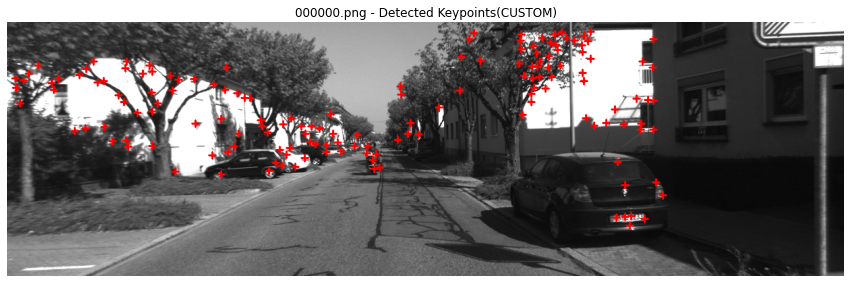

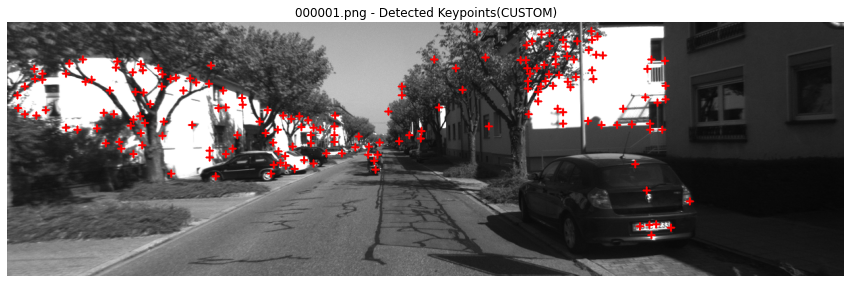

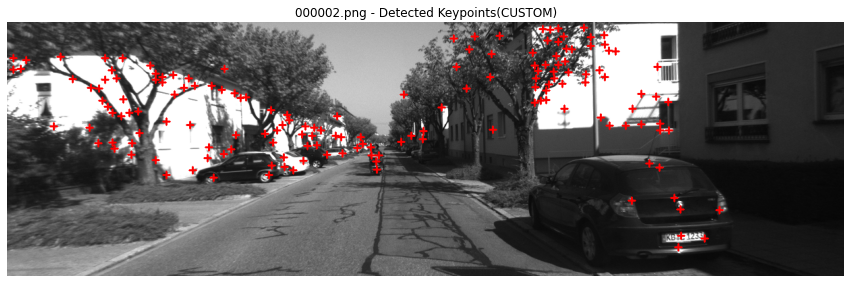

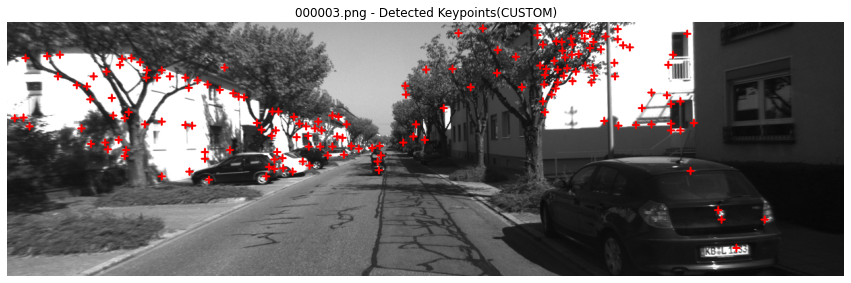

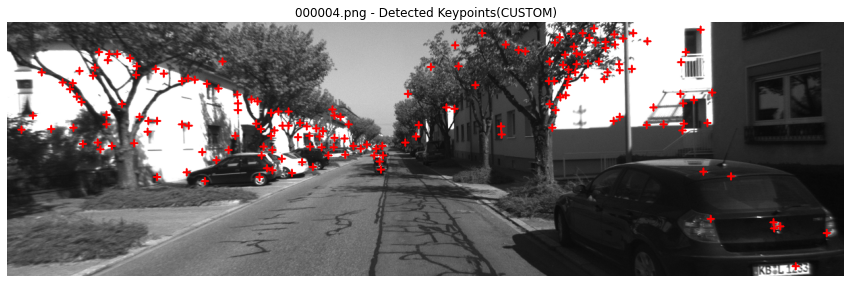

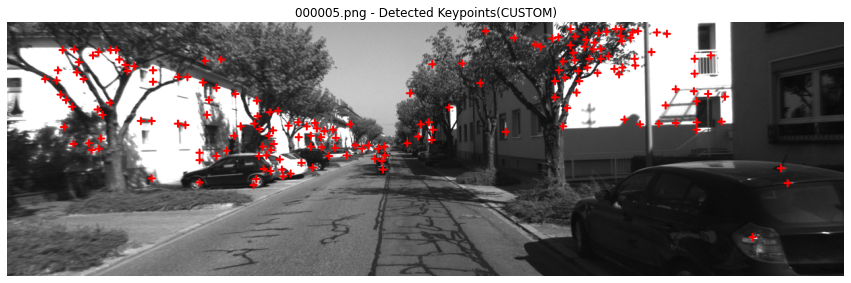

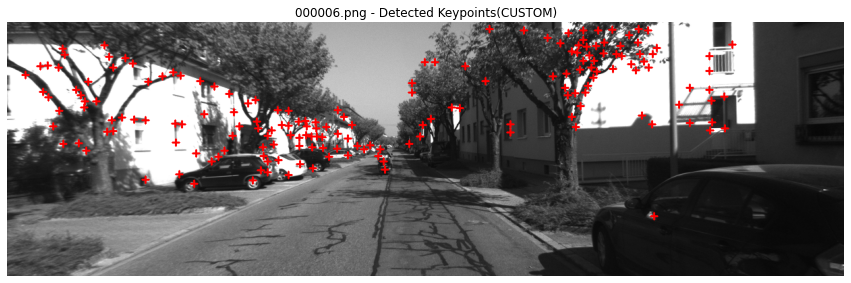

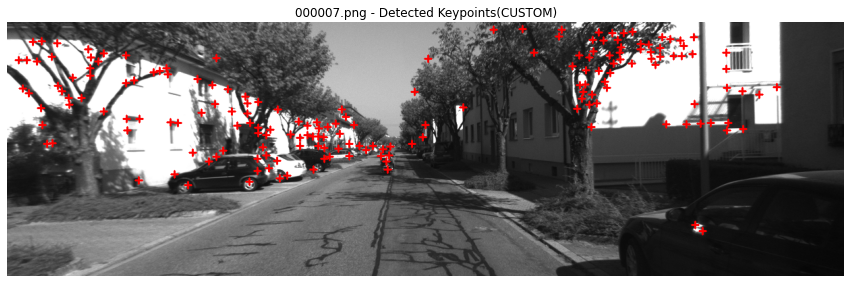

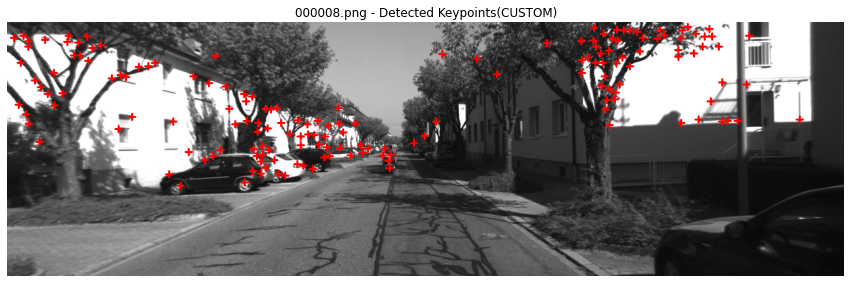

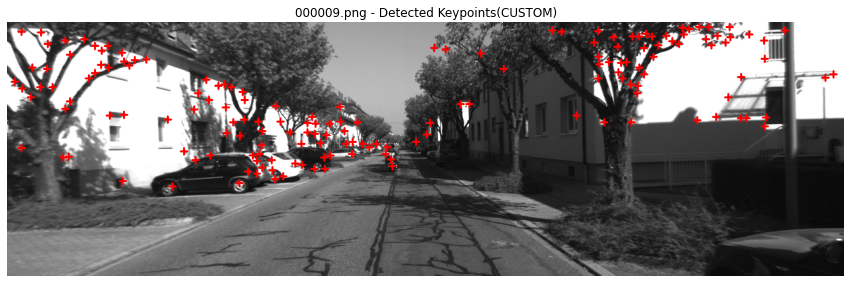

In [17]:
files_list = os.listdir('./results/custom')
files_list.sort()

for file in files_list[0:10]:
    display_img('./results/custom/', file, " - Detected Keypoints(CUSTOM)")

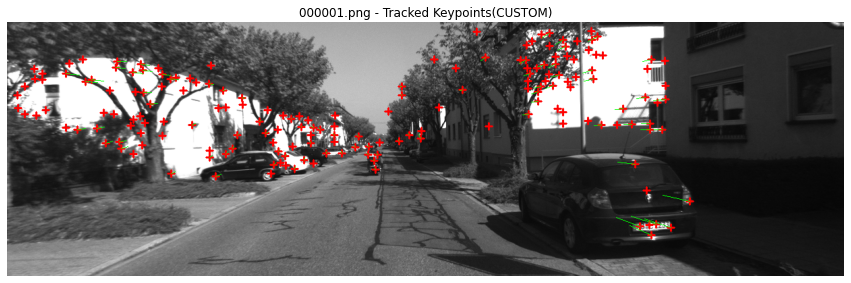

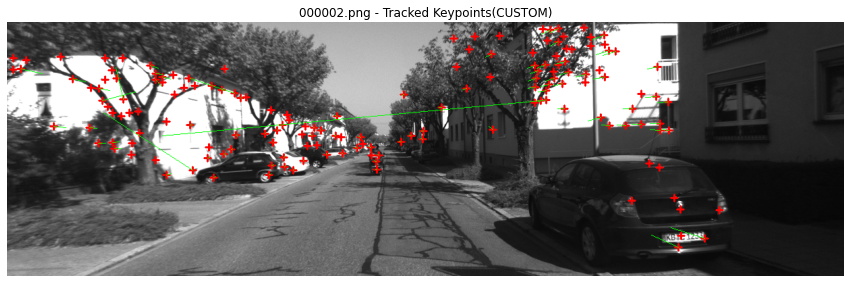

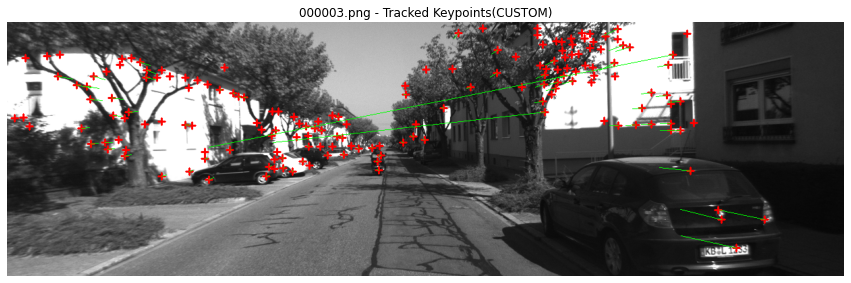

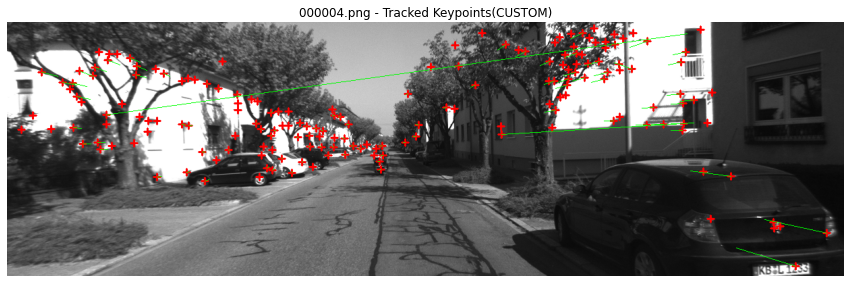

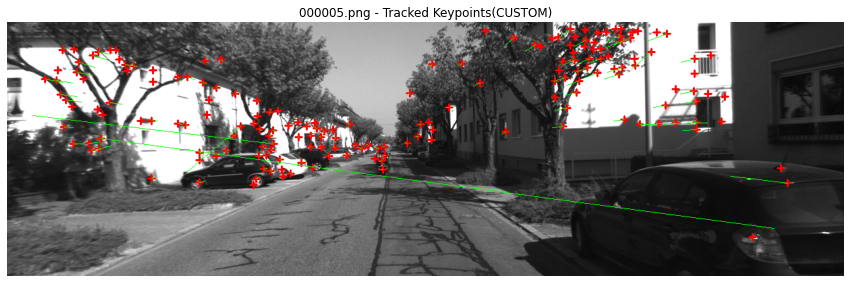

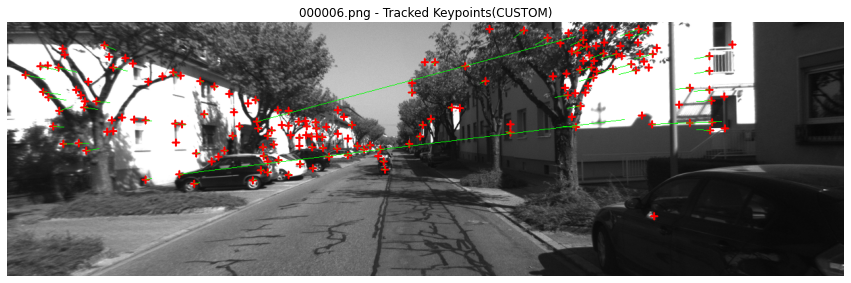

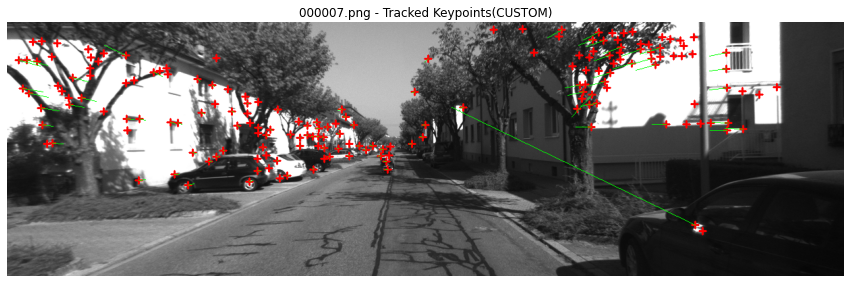

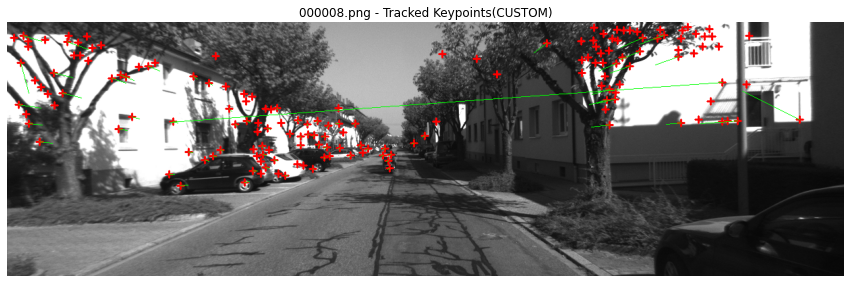

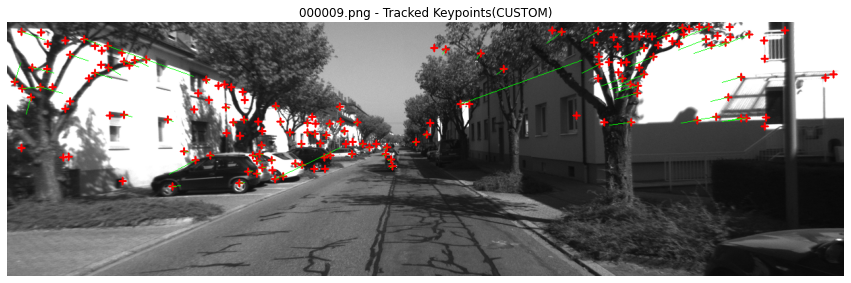

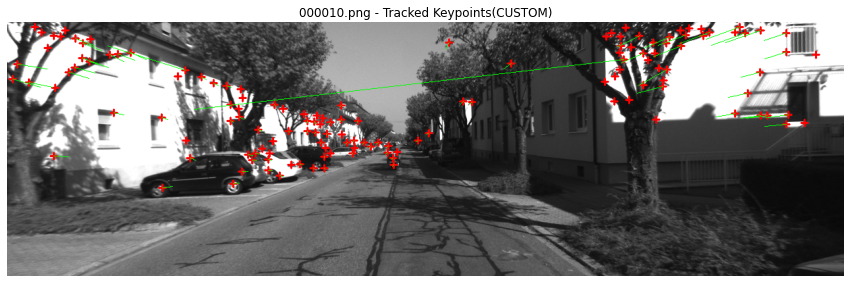

In [21]:
files_list = os.listdir('./output/custom')
files_list.sort()

for file in files_list[0:10]:
    display_img('./output/custom/', file, " - Tracked Keypoints(CUSTOM)")

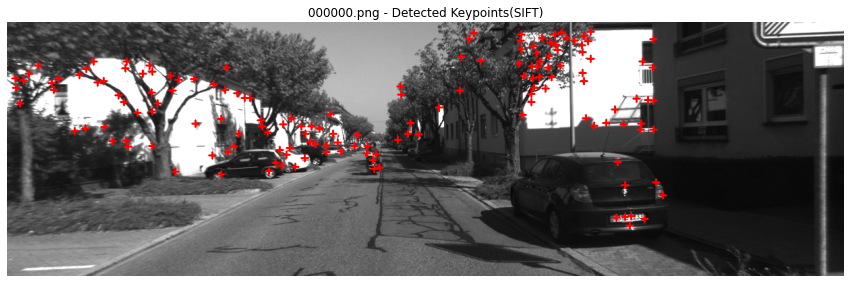

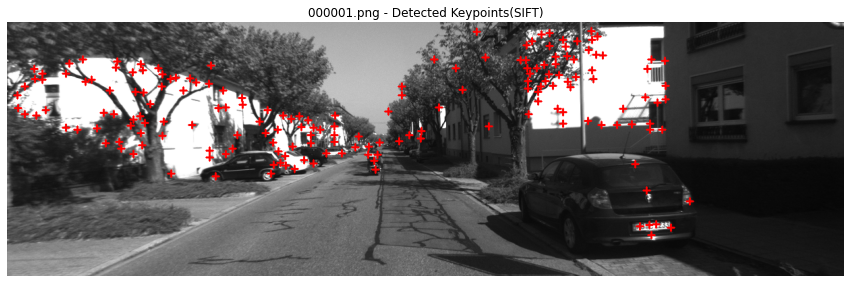

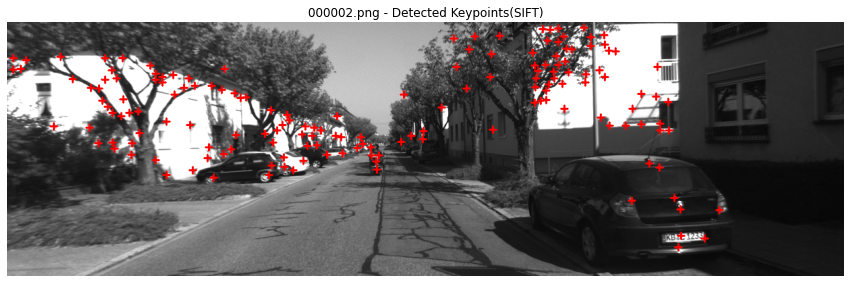

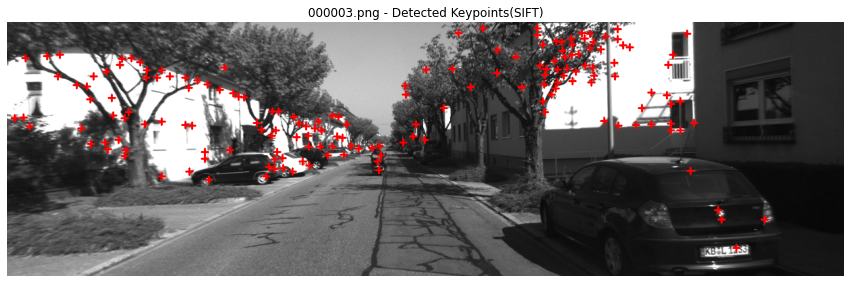

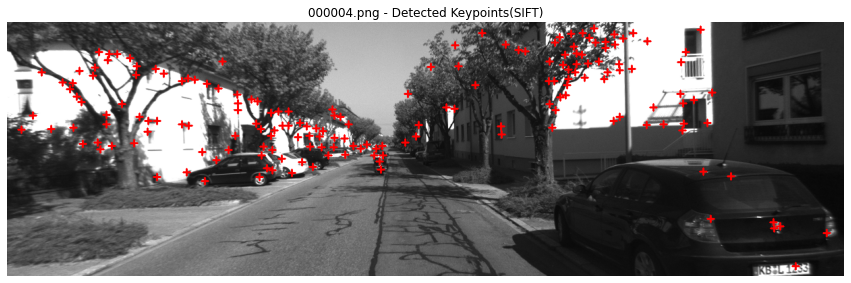

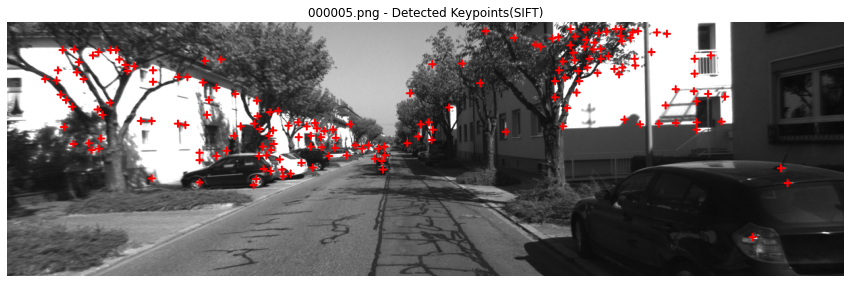

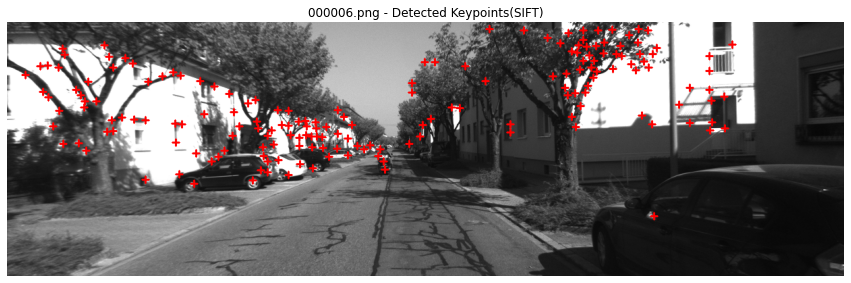

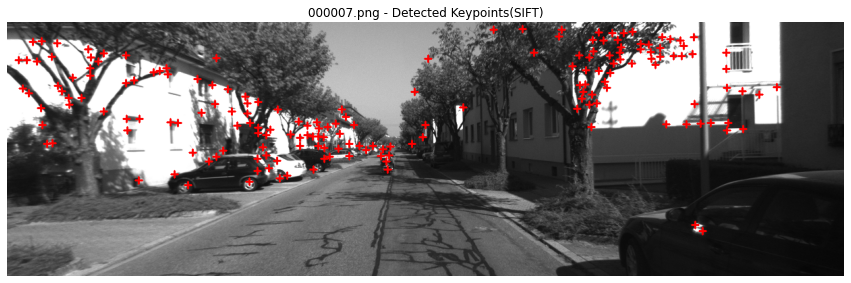

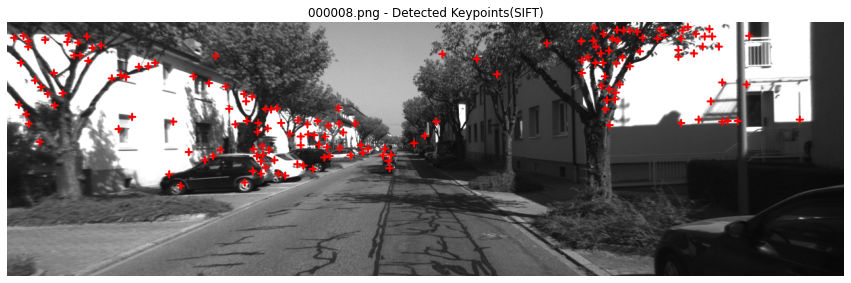

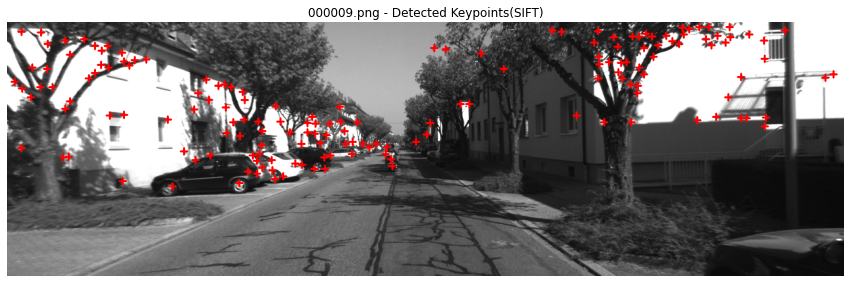

In [19]:
files_list = os.listdir('./results/sift')
files_list.sort()

for file in files_list[0:10]:
    display_img('./results/sift/', file, " - Detected Keypoints(SIFT)")

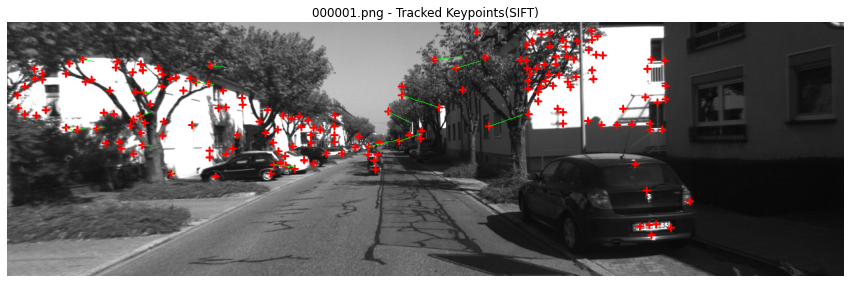

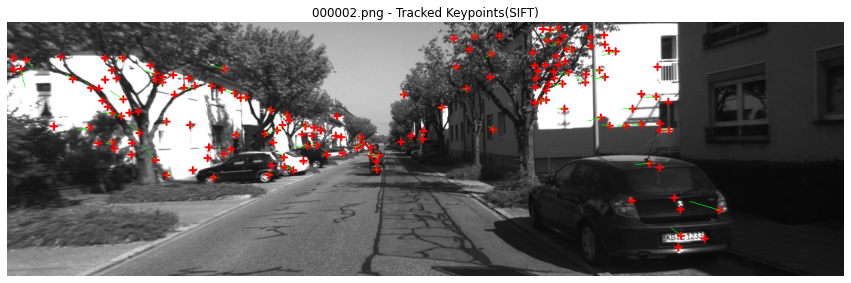

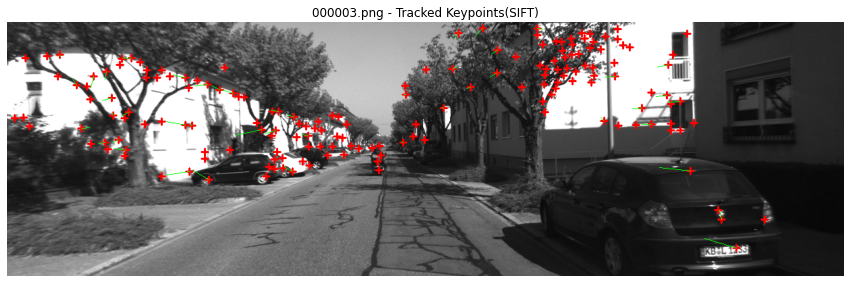

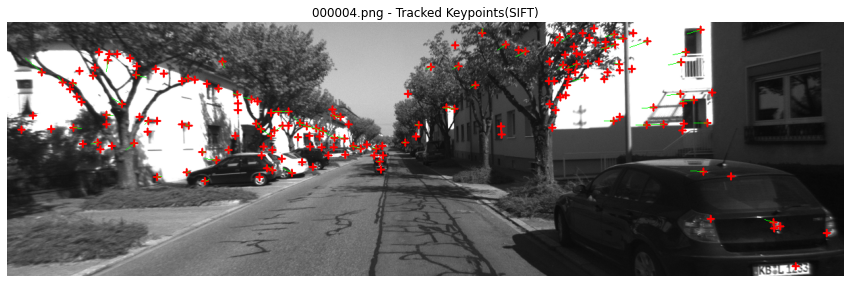

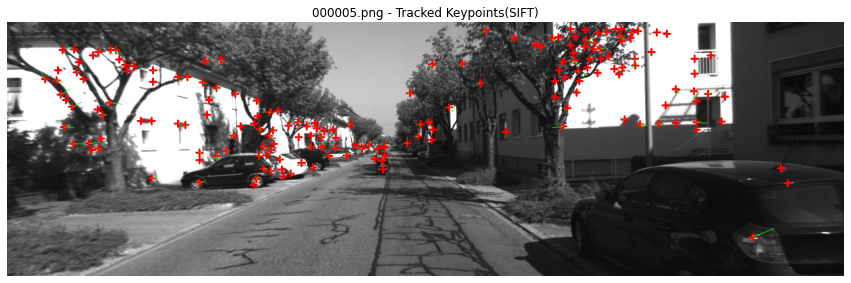

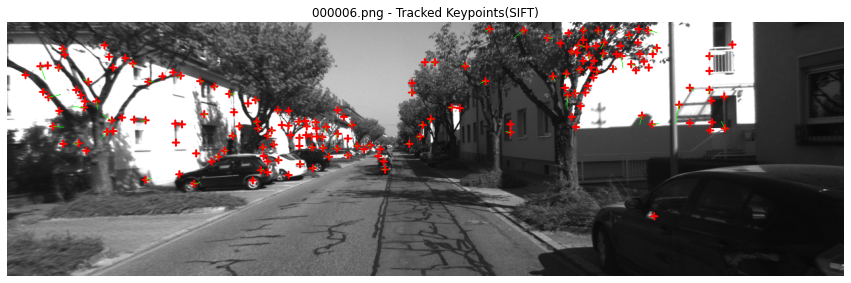

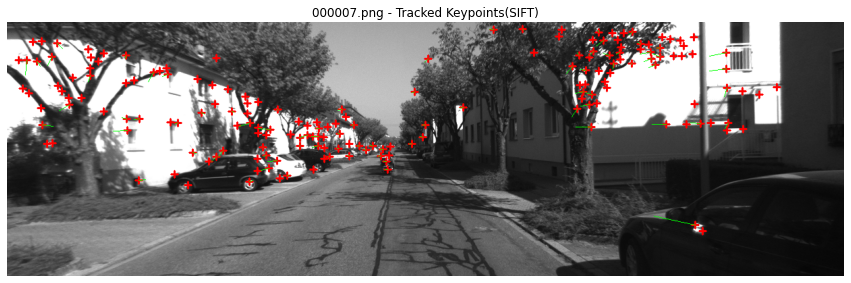

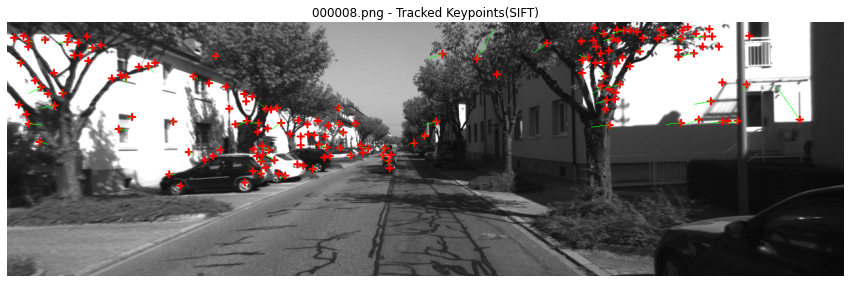

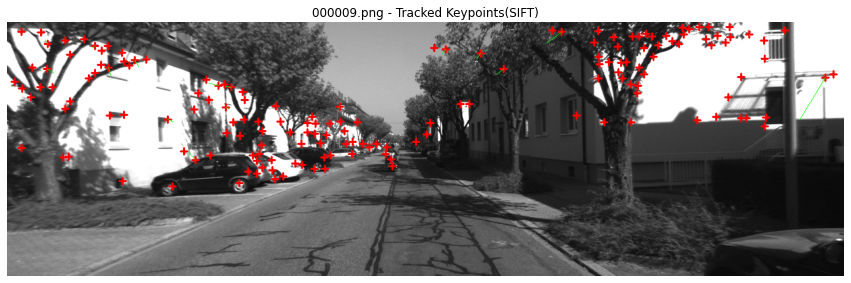

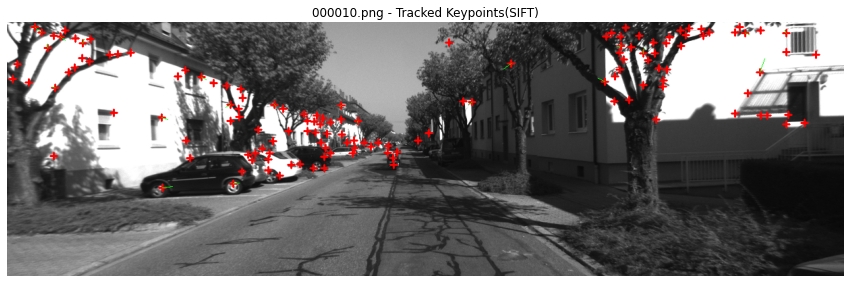

In [22]:
files_list = os.listdir('./output/sift')
files_list.sort()

for file in files_list[0:10]:
    display_img('./output/sift/', file, " - Tracked Keypoints(SIFT)")